In [6]:
import numpy as np
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt


from collections import deque, defaultdict


from pgmpy.estimators import BayesianEstimator
from pgmpy.models import DiscreteBayesianNetwork
from pgmpy.inference import VariableElimination


SEED = 40496259

path = "./data/OREGANO_V2.1.tsv"

In [7]:
oregano_df = pd.read_csv(path, sep='\t', header=None, names=['subject', 'predicate', 'object'])
oregano_df.head()

,subject,predicate,object
0,COMPOUND:1,has_code,B01AE02
1,COMPOUND:2,has_code,L01FE01
2,COMPOUND:3,has_code,R05CB13
3,COMPOUND:4,has_code,L01XX29
4,COMPOUND:5,has_code,L04AB01


Defining a helper function `get_type()` that extracts the type of the node. Exception for `OBJECT_CODE` which is not explicitly defined.

In [8]:
def get_type(node):
    if ":" in node:
        return node.split(":", 1)[0] # Spliting the node name and returning what is before the ':'
    else:
        return "OBJECT_CODE"         # Adding the exception for the OBJECT_CODE

# Q1

In [9]:
relations = oregano_df['predicate'].unique()
for relation in relations:
    print(relation)

has_code
has_target
increase_activity
has_activity
decrease_activity
increase_effect
has_effect
decrease_effect
increase_efficacy
decrease_efficacy
causes_condition
has_phenotype
is_affecting
is_substance_that_treats
acts_within
has_indication
has_side_effect
gene_product_of


#### Challenge

We need to classify these relationships so that the indirect relations we are trying to infer do not end up being negative. For example, we may come across a `COMPOUND` that has multiple `has_target` relationships, and has indirect relationship with a `DISEASE`. But it may have a predicate of `causes_condition`, and it may be indirectly causing a disease. Or it may just be an indirect relationship that has `decrease_efficacy` and `increase_efficacy`, which means that compound is just linked to another compound, and it may not even treat that disease. In summary, a compound could be just linked indirectly with a disease and does not necessarily cure it

The relationships here are also nonsensical. They go between compounds again and again and end up at a disease. This does not necessarily mean that it is treating the disease. An example of this is given below:

`pathway: COMPOUND:1247(COMPOUND) --decrease_efficacy--> COMPOUND:204(COMPOUND) -- COMPOUND:204(COMPOUND) --is_affecting--> GENE:7276(GENE) -- GENE:7276(GENE) --causes_condition--> DISEASE:1541(DISEASE)`




In [10]:
#####################################################################################################
# THIS CODE IS THE ORIGINAL IMPLEMENTATION, AND TAKES A LONG TIME TO RUN SO IT IS INTERUPTED.       # 
# IT IS ONLY USED FOR OBSERVATIONS AND DOES NOT CARRY AND SIGNIFICANCE TO THE WORKING OF THE CODE   #
#####################################################################################################




oregano_df["subject_node"] = oregano_df["subject"].map(get_type)
oregano_df["object_node"] = oregano_df["object"].map(get_type)

compound_counts = oregano_df[oregano_df['predicate']=='has_target']['subject'].value_counts()
multiple_has_target_compounds = compound_counts[compound_counts > 1].index.tolist()

G = nx.DiGraph()
for _, row in oregano_df.iterrows():
    G.add_node(row['subject'], type=row['subject_node'])
    G.add_node(row['object'], type=row['object_node'])
    G.add_edge(row['subject'], row['object'], relation=row['predicate'])

directy_treats = set(tuple(x) for x in oregano_df[oregano_df['predicate']=='is_substance_that_treats'][['subject','object']].values)

def infer_potential_treated_diseases(compound, max_hops=4):
    visited = set()
    queue = deque([(compound, [])])
    inferred_diseases = defaultdict(list)

    while queue:
        current_node, path = queue.popleft()
        visited.add(current_node)

        if len(path) > max_hops:
            continue

        for _, neighbor, d in G.edges(current_node, data=True):
            rel = d['relation']

            if (compound, neighbor) in directy_treats:
                continue

            new_path = path + [(current_node, neighbor, rel)]

            if G.nodes[neighbor]['type'] == 'DISEASE':
                inferred_diseases[neighbor].append(new_path)
            elif neighbor not in visited:
                queue.append((neighbor, new_path))

    return inferred_diseases

for compound in multiple_has_target_compounds:
    results = infer_potential_treated_diseases(compound)
    if not results:
        continue
    print(f"\nselected compound: {compound}")
    for disease, paths in list(results.items())[:3]:  
        print(f"\npotential disease it might treat: {disease}")
        for path in paths:
            pathway_str = " -- ".join([f"{src}({G.nodes[src]['type']}) --{rel}--> {tgt}({G.nodes[tgt]['type']})" 
                                       for src, tgt, rel in path])
            print(f"pathway: {pathway_str}")



selected compound: COMPOUND:78143

potential disease it might treat: DISEASE:8135
pathway: COMPOUND:78143(COMPOUND) --has_target--> PROTEIN:150(PROTEIN) -- PROTEIN:150(PROTEIN) --gene_product_of--> GENE:30803(GENE) -- GENE:30803(GENE) --causes_condition--> DISEASE:8135(DISEASE)

potential disease it might treat: DISEASE:16897
pathway: COMPOUND:78143(COMPOUND) --has_target--> PROTEIN:150(PROTEIN) -- PROTEIN:150(PROTEIN) --gene_product_of--> GENE:30803(GENE) -- GENE:30803(GENE) --causes_condition--> DISEASE:16897(DISEASE)

potential disease it might treat: DISEASE:16347
pathway: COMPOUND:78143(COMPOUND) --has_target--> PROTEIN:150(PROTEIN) -- PROTEIN:150(PROTEIN) --gene_product_of--> GENE:30803(GENE) -- GENE:30803(GENE) --causes_condition--> DISEASE:16347(DISEASE)

selected compound: COMPOUND:1247

potential disease it might treat: DISEASE:1654
pathway: COMPOUND:1247(COMPOUND) --decrease_efficacy--> COMPOUND:23(COMPOUND) -- COMPOUND:23(COMPOUND) --is_substance_that_treats--> DISEASE:165

KeyboardInterrupt: 

#### Proposed Solution
The relationships below have been classified into 2 categories: positive/neutral and negative. This helps us to only include those relationships that have a possibility of curing a disease.

| Predicate                                           | Effect Type          | Explanation                                                               |
| --------------------------------------------------- | -------------------- | ------------------------------------------------------------------------- |
| **acts_within(x:GENE, y:PATHWAY)**                  | Neutral              | Just states membership or function in a pathway.                          |
| **causes_condition(x:GENE, y:DISEASE)**             | Negative             | The gene contributes to a disease (harmful effect).                       |
| **decrease_activity(x:COMPOUND, y:ACTIVITY)**       | Negative             | Compound inhibits activity, reducing a function.                          |
| **decrease_effect(x:COMPOUND, y:EFFECT)**           | Negative             | Compound reduces an effect, usually undesirable.                          |
| **decrease_efficacy(x:COMPOUND, y:COMPOUND)**       | Negative             | Compound lowers the efficacy of another compound (drug-drug interaction). |
| **gene_product_of(x:PROTEIN, y:GENE)**              | Neutral              | Simply identifies protein as the product of a gene.                       |
| **has_activity(x:COMPOUND, y:ACTIVITY)**            | Neutral / Positive   | Indicates compound activity; could be beneficial depending on context.    |
| **has_code(x:COMPOUND, y:OBJECT_CODE)**             | Neutral              | Identifies compound codes; informational.                                 |
| **has_effect(x:COMPOUND, y:EFFECT)**                | Neutral / Positive   | Shows an effect of a compound; context-dependent.                         |
| **has_indication(x:COMPOUND, y:INDICATION)**        | Positive             | Shows medical use for treatment.                                          |
| **has_phenotype(x:DISEASE, y:PHENOTYPE)**           | Neutral              | Associates disease with phenotype; informational.                         |
| **has_side_effect(x:COMPOUND, y:SIDE_EFFECT)**      | Negative             | Indicates a harmful or undesired side effect.                             |
| **has_target(x:COMPOUND, y:PROTEIN / MOLECULE)**    | Neutral              | Identifies target binding; effect depends on context.                     |
| **increase_activity(x:COMPOUND, y:ACTIVITY)**       | Positive             | Compound enhances an activity, potentially beneficial.                    |
| **increase_effect(x:COMPOUND, y:EFFECT)**           | Positive             | Compound increases an effect, context-dependent.                          |
| **increase_efficacy(x:COMPOUND, y:COMPOUND)**       | Positive             | Compound increases efficacy of another compound (synergistic).            |
| **is_affecting(x:COMPOUND, y:GENE)**                | Neutral / Contextual | Compound affects a gene; positive or negative depending on effect.        |
| **is_substance_that_treats(x:COMPOUND, y:DISEASE)** | Positive             | Compound is used to treat disease; beneficial.                            |


And the second problem of nonsensical links can be solved by only including those relationships that have `COMPOUNDS`, `DISEASE`, `PROTEIN`, and `GENE` which makes more biological sense. 

The following relationships were narrowed down to produce the best results. The ones commented out were initially thought to be useful, but later removed as they contributed to the issue of nonsensical relationships. For example the `increase_activity`, `increase_effect`, `has_code`,`acts_within`, `has_indication`, `has_activity`, `has_phenotype`, `has_effect`, and `has_side_effect` relationships have the objects that are a "dead-end"; Their object nodes do not become a subject for another relationship. Including these relationships just wastes resources and produces results that are not what we are looking for. 

`increase_efficacy` was removed because it has both subject and object as `COMPOUND`. When included, this relationship gives a result that links two compounds on the basis of the fact that one compound increases the efficiency of the other compound, which in turn is treating a disease or repeating this relationship with another compound. 

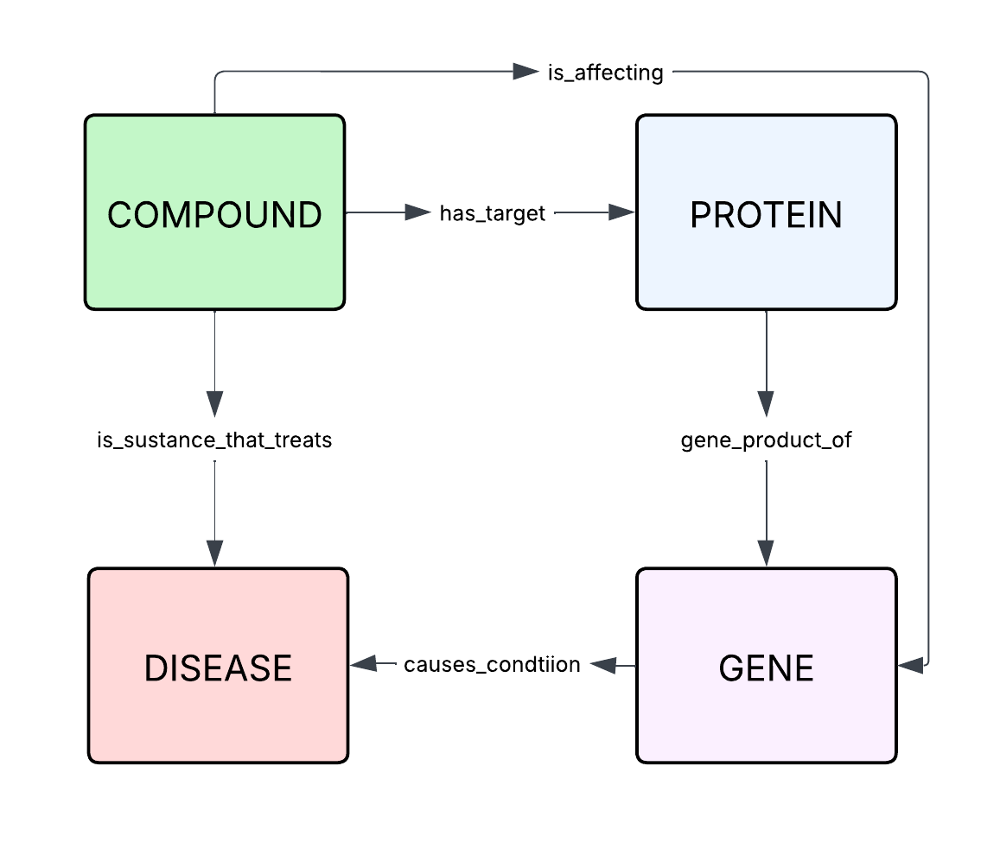


In [11]:
# Defining allowed relations for biologically plausible inference
allowed_path_relations = [
    "has_target",               #  compound -> protein/molecule
    "gene_product_of",          #  protein -> gene
    "causes_condition",         #  gene -> disease
    "is_affecting",             #  compound -> gene
    "is_substance_that_treats"  #  compound -> disease : for final check


    # relations that produce nonsensical results 
    # "acts_within",            #  gene -> pathway
    # "has_indication",         #  compound -> indication
    # "has_activity",           #  compound -> activity
    # "has_phenotype",          #  disease -> phenotype
    # "has_effect",             #  compound -> effect
    # "increase_activity",      #  compound -> activity
    # "increase_effect",        #  compound -> effect
    # "increase_efficacy",      #  compound -> compound
    # "has_side_effect",        #  compound -> side effect
    # "has_code",               #  compound -> object code
]

Extracting the node type of both the subject and object columns and adding them in to the `oregano_df` DataFrame. 

In [12]:
# Maping node types
oregano_df["subject_node"] = oregano_df["subject"].map(get_type)
oregano_df["object_node"] = oregano_df["object"].map(get_type)


Storing all the `COMPOUND`'s count of `has_target` relationship and filtering them to get only those which have more than one of that relationship. 

In [13]:
compound_counts = oregano_df[oregano_df['predicate']=='has_target']['subject'].value_counts()
multiple_has_target_compounds = compound_counts[compound_counts > 1].index.tolist()

Building a NetworkX graph that contains all the subject and object nodes along with the edges that represent the relationships between them. 

In [14]:
# Building NetworkX graph
G = nx.DiGraph()
for _, row in oregano_df.iterrows():
    # Adding nodes - subject and object
    G.add_node(row['subject'], type=row['subject_node'])
    G.add_node(row['object'], type=row['object_node'])
    # Adding the edges : predicate
    G.add_edge(row['subject'], row['object'], relation=row['predicate'])

# directy_treats set contais the relationships that should be skipped
directy_treats = set(tuple(x) for x in oregano_df[oregano_df['predicate']=='is_substance_that_treats'][['subject','object']].values)


This function is used to infer new diseases a compound may treat which make sense biologically (not just ontologically) while avoiding negative relationships and direct `is_substance_that_treats` relationship. It relies on Breadth First Search (BFS) principles to do this effectively.

- 1 : Initialize BFS structures: a visited set, a queue storing (node, path) starting from the compound, and inferred_diseases to collect diseases and their inference paths.
- 2 : Run the BFS loop, expanding outward from the compound while marking nodes as visited.
- 3 : Enforce max_hops to limit path length and keep the search tractable.
- 4 : Iterate over all outgoing edges of the current node.
- 5 : Apply biological constraints by following only allowed relations and skipping direct COMPOUND → DISEASE links.
- 6 : Extend the current path to form a new valid inference path.
- 7 : If a disease node is reached, record it as an inferred treatment; otherwise, continue BFS.

In [15]:
def infer_potential_treated_diseases(compound, max_hops=4):
    # 1 : Create a set of the `visited` nodes. Each of the `queue` entry stores the current starting node (which is a compound) and the 
    # path used to reach this node (initialized to an empty list). `infered_diseases` creates a dictionary where each key will be populated 
    # by a disease, each value is a list of the inference paths, and new keys added automatically get empty lists as their value.
    visited = set()
    queue = deque([(compound, [])])
    inferred_diseases = defaultdict(list)

    # 2 : The main BFS loop, which explores outwards (in breadth) from the starting compound. 
    # It also adds the visited nodes to the `visited` list.
    while queue:
        current_node, path = queue.popleft()
        visited.add(current_node)

        # 3 : The limiting condition that prevents the paths from getting longer than `max_hops`, which keeps the search controlled. 
        if len(path) > max_hops:
            continue
            
        # 4 : Loop through all the edges of the current node and store it in the `rel` variable.
        for _, neighbor, d in G.edges(current_node, data=True):
            rel = d['relation']

            # 5 : Applies the biological filtering by only traversing the allowed relationships, and skipping direct `COMPOUND -> DISEASE` relationships. 
            if rel not in allowed_path_relations or (compound, neighbor) in directy_treats:
                continue

            # 6 : If the above condition is satisfied, then that path is stores in the `new_path` variable
            new_path = path + [(current_node, neighbor, rel)]

            # 7 : If a disease is reached, then it is inferred as a possible treatment of the disease, if not the BFS continues
            if G.nodes[neighbor]['type'] == 'DISEASE':
                inferred_diseases[neighbor].append(new_path)

            elif neighbor not in visited:
                queue.append((neighbor, new_path))

    return inferred_diseases


This block of code loops through every compound that has multiple `has_target` relationships and runs the `infer_potential_treated_diseases` function on each one. It then prints the path taken from the `COMPOUND` to the `DISEASE`

In [16]:
# Looping over all multi-target compounds
for compound in multiple_has_target_compounds:
    results = infer_potential_treated_diseases(compound)
    if not results:
        continue
    # Printing the top 3 infered diseases' path 
    print(f"\nSelected compound: {compound}")
    for disease, paths in list(results.items())[:3]:  
        print(f"\nPotential disease it might treat: {disease}")
        for path in paths:
            pathway_str = " -- ".join([f"{src} --{rel}--> {tgt}" 
                                       for src, tgt, rel in path])
            print(f"Pathway: {pathway_str}")


Selected compound: COMPOUND:78143

Potential disease it might treat: DISEASE:8135
Pathway: COMPOUND:78143 --has_target--> PROTEIN:150 -- PROTEIN:150 --gene_product_of--> GENE:30803 -- GENE:30803 --causes_condition--> DISEASE:8135

Potential disease it might treat: DISEASE:16897
Pathway: COMPOUND:78143 --has_target--> PROTEIN:150 -- PROTEIN:150 --gene_product_of--> GENE:30803 -- GENE:30803 --causes_condition--> DISEASE:16897

Potential disease it might treat: DISEASE:16347
Pathway: COMPOUND:78143 --has_target--> PROTEIN:150 -- PROTEIN:150 --gene_product_of--> GENE:30803 -- GENE:30803 --causes_condition--> DISEASE:16347

Selected compound: COMPOUND:1247

Potential disease it might treat: DISEASE:3209
Pathway: COMPOUND:1247 --is_affecting--> GENE:16112 -- GENE:16112 --causes_condition--> DISEASE:3209
Pathway: COMPOUND:1247 --is_affecting--> GENE:13618 -- GENE:13618 --causes_condition--> DISEASE:3209
Pathway: COMPOUND:1247 --is_affecting--> GENE:48 -- GENE:48 --causes_condition--> DISEASE

The output above was inferred multiple times to remove the relationships that did not contribute. The ones that do appear are the only ones that are useful and biologically accurate. 

#### Conclusion
 
The first compound detected is `COMPOUND:78143` and targets 3 diseases using the same relations:

- `has_target` : This relation indicates that the compound interacts with or modulates a specific protein target. In this case the `COMPOUND:78143` targets `PROTEIN:150`. This relation specifies the target binding of a compound to a protein.

- `gene_product_of` : This relation links the protein to the gene that encodes it. Genes are segments of DNA that contain instructions for building proteins. Here `GENE:30803` contains the instruction for building the `PROTEIN:150`. 

- `causes_condition` : Given the fact that proteins can be detrimental to health, we can see by this relationship that the `PROTEIN:150` causes the diseases `DISEASE:8135`, `DISEASE:16897`, and `DISEASE:16347`. 

This repeated pattern suggests the compound's therapeutic potential in treating the diseases mentioned above. All the pathways rely on positive/neutral relationships, meaning that this relation makes biological sense. The compound interacts with a protein which is a product of a particular gene, which in turn is the reason for these diseases. The fact that multiple diseases share this pathway suggests that the compound may have relevance in treating multiple diseases, provided its interaction with the protein is beneficial. 

**Deeper Dive** : `GENE:30803` helps the cells build part of the mitochondrial engine. It can malfunction and cause muscle weakness, neurological dysfunction, and problems in infant development in severe cases. 




The code cells above do the required search for the complete dataset. This gives us a better idea of the inner workings of the code. All the results produced are of a length less than 4. Going through all of them manually, we can see that it always ends on a disease, and takes multiple relationships to reach the disease, like `has_target`, `gene_product_of`, `causes_conditon`, and `is_affecting`. Realistically, without knowing the function of each of these biological and clinical entities we cannot deduce if the compound is actually treating the disease, or just making it worse. Multiple compounds seem to have multiple `has_target` relationship. The compounds usually interact with a protein or a gene which causes a disease or related to it. 


---

# Q2

Listing the relationships that have `COMPOUND`, `GENE`, `PROTEIN`, and `DISEASE`

| Predicate                    | Subject Type | Object Type                                                                         
| ---------------------------- | --------------: | ------------------ 
| **has_target**             |      COMPOUND | PROTEIN                        
| **is_affecting**             |       COMPOUND | GENE                               
| **gene_product_of**        |         PROTEIN | GENE            
| **causes_condition**           |        GENE | DISEASE                           
| **is_substance_that_treats** |        COMPOUND | DISEASE                                
| **increase_efficacy**      |       COMPOUND | COMPOUND                        
| **decrease_efficacy**       |       COMPOUND | COMPOUND          




This code block filters the relationships to use in the BN which use the defined diseases. This removes the unrelated predicates. 

In [17]:
bn_relations = {
    "has_target",               # COMPOUND -> PROTEIN
    "is_affecting",             # COMPOUND -> GENE
    "gene_product_of",          # PROTEIN -> GENE
    "causes_condition",         # GENE -> DISEASE
    "is_substance_that_treats", # COMPOUND -> DISEASE
    "increase_efficacy",        # COMPOUND -> COMPOUND
    "decrease_efficacy"         # COMPOUND -> COMPOUND
}

oregano_bn_df = oregano_df[oregano_df["predicate"].isin(bn_relations)].copy()

Each node is being annotated with its specific node type. 

In [18]:
oregano_bn_df["subject_type"] = oregano_bn_df["subject"].map(get_type)
oregano_bn_df["object_type"] = oregano_bn_df["object"].map(get_type)

Filtered data is being separated into three relations specific tables that correspond to the main biological pathway. Even though above 7 relations have been defined above, only three are being used below. This is because in BNs, every relation must map to an edge between existing variables. These relationships are correct as we have defined all biologically relevant relations, and we are using only those consistent with the model structure. This is the distinction between available knowledge and modelled knowledge. 

Relationships being modelled for the BN

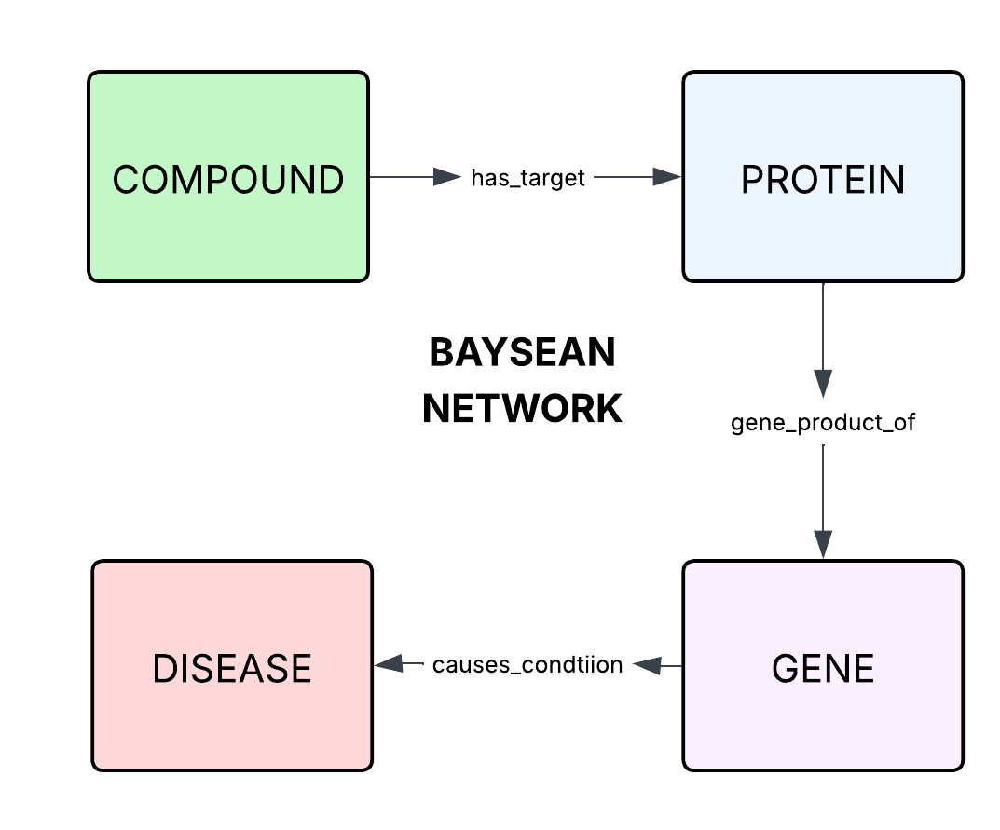

In [19]:
has_target_df = oregano_bn_df[oregano_bn_df["predicate"] == "has_target"]
gene_product_df = oregano_bn_df[oregano_bn_df["predicate"] == "gene_product_of"]
causes_condition_df = oregano_bn_df[oregano_bn_df["predicate"] == "causes_condition"]

Strict biological constraints are being enforced by discarding any triples where the subject or object node does not match the expected domain and range of the relationship. This prevents ambiguous triples, and ensures they are biologically interpretable. 

In [20]:
has_target_df = has_target_df[
    (has_target_df["subject_type"] == "COMPOUND") &
    (has_target_df["object_type"] == "PROTEIN")
]
gene_product_df = gene_product_df[
    (gene_product_df["subject_type"] == "PROTEIN") &
    (gene_product_df["object_type"] == "GENE")
]
causes_condition_df = causes_condition_df[
    (causes_condition_df["subject_type"] == "GENE") &
    (causes_condition_df["object_type"] == "DISEASE")
]

Renaming the subject and object columns to the specific node type

In [21]:
ht = has_target_df[["subject", "object"]].rename(
    columns={"subject": "Compound", "object": "Protein"}
)
gp = gene_product_df[["subject", "object"]].rename(
    columns={"subject": "Protein", "object": "Gene"}
)
cc = causes_condition_df[["subject", "object"]].rename(
    columns={"subject": "Gene", "object": "Disease"}
)

Relational joins are used to reconstruct full biological pathways :
- Compound -> Protein is joined with Protein -> Gene
- The resulting paths are joined with Gene -> Disease

In the initial versions, the duplicates were being dropped which caused the conditional probabilities to turn out almost the same. Removing the `drop_duplicates` makes the CPD learn asymmetric probabilities and joint probabilities are spread more naturally.

In [22]:
cp_df = ht.merge(gp, on="Protein", how="inner")
cpgd_full = cp_df.merge(cc, on="Gene", how="inner")

# cpgd_full = cpgd_full[["Compound", "Protein", "Gene", "Disease"]].drop_duplicates()
cpgd_full = cpgd_full[["Compound", "Protein", "Gene", "Disease"]]

print("Total unique (C,P,G,D) tuples:", len(cpgd_full))

Total unique (C,P,G,D) tuples: 120981


Limiting the state space of each variable to the most frequently occurring entity. Without this the BN would require massive conditional-probability tables and exceed memory limit. Despite this limit, nodes still represent biological entities, just within a smaller sample space. Using just 10-20 samples to draw obervations.

In [23]:
N_COMPOUNDS = 10
N_PROTEINS  = 20
N_GENES     = 20
N_DISEASES  = 20

top_compounds = cpgd_full["Compound"].value_counts().head(N_COMPOUNDS).index
top_proteins  = cpgd_full["Protein"].value_counts().head(N_PROTEINS).index
top_genes     = cpgd_full["Gene"].value_counts().head(N_GENES).index
top_diseases  = cpgd_full["Disease"].value_counts().head(N_DISEASES).index

Produces the dataset that will be used to learn the BN parameters. Each row corresponds to one observed biological pathway within the selected subgraph, and each column represents a random variable whose values are actual node identifiers. 

In [24]:
data_df = cpgd_full[
    cpgd_full["Compound"].isin(top_compounds) &
    cpgd_full["Protein"].isin(top_proteins) &
    cpgd_full["Gene"].isin(top_genes) &
    cpgd_full["Disease"].isin(top_diseases)
].reset_index(drop=True)

print("Filtered (C,P,G,D) tuples:", len(data_df))
print(data_df)

Filtered (C,P,G,D) tuples: 75
          Compound       Protein        Gene        Disease
0    COMPOUND:5447  PROTEIN:6154  GENE:29744   DISEASE:3724
1    COMPOUND:5447  PROTEIN:6154  GENE:29744  DISEASE:12575
2    COMPOUND:5447  PROTEIN:6154  GENE:29744   DISEASE:5566
3    COMPOUND:5447  PROTEIN:6154  GENE:29744   DISEASE:5344
4    COMPOUND:5447  PROTEIN:6154  GENE:29744   DISEASE:5275
..             ...           ...         ...            ...
70    COMPOUND:307   PROTEIN:946  GENE:29295  DISEASE:13937
71    COMPOUND:307   PROTEIN:946  GENE:29295  DISEASE:11343
72    COMPOUND:307   PROTEIN:946  GENE:29295   DISEASE:3591
73  COMPOUND:35835  PROTEIN:1630  GENE:25006   DISEASE:4211
74  COMPOUND:35835  PROTEIN:1630  GENE:25006   DISEASE:4211

[75 rows x 4 columns]


We are getting the relationships in a tabular format, with all the nodes arranged in the way they interact with one another. Despite the maximum number of node defined above as 20, we get 23 rows, this is because some nodes appear multiple times with different nodes. 

`joint_prob_from_cpds` computes the joint probability of one complete row under a BN by multiplying the appropriiate CPD entries. 
$$ P(C,P,G,D)=P(C)P(P∣C)P(G∣P)P(D∣G) $$


In [25]:
def joint_prob_from_cpds(bn, row):
    prob = 1.0

    for node in bn.nodes():
        cpd = bn.get_cpds(node)

        # If unseen state = probability 0
        if row[node] not in cpd.state_names[node]:
            return 0.0

        parents = cpd.get_evidence()

        if parents is None: 
            state_idx = cpd.state_names[node].index(row[node])
            prob *= cpd.values[state_idx]

        else:
            query = {node: row[node]}

            for parent in parents:
                if row[parent] not in cpd.state_names[parent]:
                    return 0.0
                query[parent] = row[parent]

            prob *= cpd.get_value(**query)

    return prob


- Step 1 : Defining the BN and its graphical structure. 
$$ Compound → Protein → Gene → Disease  $$

- Step 2 : Learning the proabilites from the data using the `fit` function. `BayesianEstimator` estimator adds Dirichlet smoothing and is crucial for biological data. `BDeu` assumes no strong prior biological bias. `equivalent_sample_size=0.1` adds verty light smoothing and avoids zero probabilities, while still allowing real data frequencies to dominate. 

- Step 3 : Computing the joint probability for each row : $$ P(C=c)P(P=p∣C=c)P(G=g∣P=p)P(D=d∣G=g) $$ This uses the BN’s learned CPDs and multiplies them according to the network factorisation rule.

In [26]:
# step 1
bn = DiscreteBayesianNetwork([
    ("Compound", "Protein"),
    ("Protein", "Gene"),
    ("Gene", "Disease")
])

# step 2
bn.fit(
    data_df,
    estimator=BayesianEstimator,
    prior_type="BDeu",
    equivalent_sample_size=0.1
)

# step 3
data_df["joint_probability"] = data_df.apply(
    lambda row: joint_prob_from_cpds(bn, row),
    axis=1
)

INFO:pgmpy: Datatype (N=numerical, C=Categorical Unordered, O=Categorical Ordered) inferred from data: 
 {'Compound': 'C', 'Protein': 'C', 'Gene': 'C', 'Disease': 'C'}


In [27]:
print(data_df)

          Compound       Protein        Gene        Disease  joint_probability
0    COMPOUND:5447  PROTEIN:6154  GENE:29744   DISEASE:3724           0.026626
1    COMPOUND:5447  PROTEIN:6154  GENE:29744  DISEASE:12575           0.026626
2    COMPOUND:5447  PROTEIN:6154  GENE:29744   DISEASE:5566           0.026626
3    COMPOUND:5447  PROTEIN:6154  GENE:29744   DISEASE:5344           0.026626
4    COMPOUND:5447  PROTEIN:6154  GENE:29744   DISEASE:5275           0.026626
..             ...           ...         ...            ...                ...
70    COMPOUND:307   PROTEIN:946  GENE:29295  DISEASE:13937           0.013248
71    COMPOUND:307   PROTEIN:946  GENE:29295  DISEASE:11343           0.026479
72    COMPOUND:307   PROTEIN:946  GENE:29295   DISEASE:3591           0.026479
73  COMPOUND:35835  PROTEIN:1630  GENE:25006   DISEASE:4211           0.026228
74  COMPOUND:35835  PROTEIN:1630  GENE:25006   DISEASE:4211           0.026228

[75 rows x 5 columns]


When duplicates were being dropped, all the probabilities were $ 1\over n\_rows $ because every entry only appeared once, making it a uniform distribution. With the duplicated added, the probability is more natural. 

**Key observations** : 
- Values range roughly from 0.013 -> 0.026
- Some pathways occur twice with the same probability
- Some diseases linked to the same compound–protein–gene chain share identical probabilities
- Some rows have identical compound, protein, and gene with only the disease changing. This indicates the BN learning biologically plausible probabilities. 
- The rows that have probability of 0.13 have the same compound with more proteins, genes appearing across many pathways, and a disease less frequently being linked to that gene. 



In [28]:
# Increasing the number of N_* for better modelling. Why the following N values work:
# - Roots (Compound) stay dense
# - Middle layers stay identifiable
# - Disease space allows variation

N_COMPOUNDS = 3000
N_PROTEINS  = 5000
N_GENES     = 5000
N_DISEASES  = 8000


top_compounds = cpgd_full["Compound"].value_counts().head(N_COMPOUNDS).index
top_proteins  = cpgd_full["Protein"].value_counts().head(N_PROTEINS).index
top_genes     = cpgd_full["Gene"].value_counts().head(N_GENES).index

disease_support = cpgd_full.groupby("Disease")["Gene"].nunique()
top_diseases = disease_support.sort_values(ascending=False).head(N_DISEASES).index



data_df = cpgd_full[
    cpgd_full["Compound"].isin(top_compounds) &
    cpgd_full["Protein"].isin(top_proteins) &
    cpgd_full["Gene"].isin(top_genes) &
    cpgd_full["Disease"].isin(top_diseases)
].reset_index(drop=True)

print("Filtered data_df size:", len(data_df))

bn = DiscreteBayesianNetwork([
    ("Compound", "Protein"),
    ("Protein", "Gene"),
    ("Gene", "Disease")
])



bn.fit(
    data_df,
    estimator=BayesianEstimator,
    prior_type="BDeu",
    equivalent_sample_size=0.1   
)

data_df["joint_probability"] = data_df.apply(
    lambda row: joint_prob_from_cpds(bn, row),
    axis=1
)

data_df

INFO:pgmpy: Datatype (N=numerical, C=Categorical Unordered, O=Categorical Ordered) inferred from data: 
 {'Compound': 'C', 'Protein': 'C', 'Gene': 'C', 'Disease': 'C'}


Filtered data_df size: 103162


,Compound,Protein,Gene,Disease,joint_probability
0,COMPOUND:4,PROTEIN:11,GENE:29205,DISEASE:14461,0.000010
1,COMPOUND:4,PROTEIN:11,GENE:29205,DISEASE:14710,0.000010
2,COMPOUND:4,PROTEIN:11,GENE:29205,DISEASE:11587,0.000010
3,COMPOUND:4,PROTEIN:11,GENE:29205,DISEASE:11584,0.000010
4,COMPOUND:4,PROTEIN:12,GENE:29207,DISEASE:17340,0.000010
...,...,...,...,...,...
103157,COMPOUND:76528,PROTEIN:1630,GENE:25006,DISEASE:4211,0.000019
103158,COMPOUND:76528,PROTEIN:1630,GENE:25006,DISEASE:4211,0.000019
103159,COMPOUND:76528,PROTEIN:724,GENE:34742,DISEASE:15526,0.000010
103160,COMPOUND:76528,PROTEIN:724,GENE:34742,DISEASE:14813,0.000010


All other observations remain the same, only the magnitude has changed.

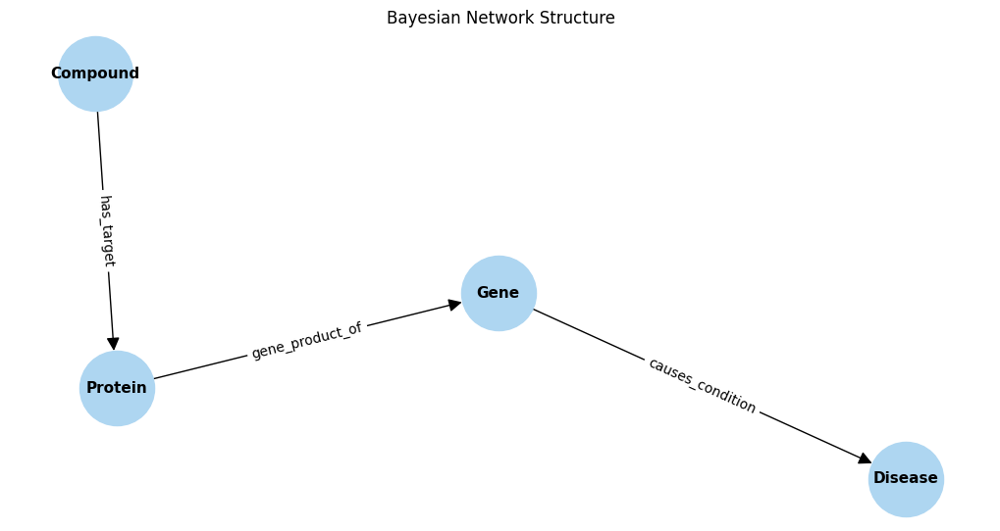

In [29]:
def infer_edge_labels_for_bn(bn, oregano_bn_df):
    type_map = {
        "Compound": "COMPOUND",
        "Protein": "PROTEIN",
        "Gene": "GENE",
        "Disease": "DISEASE"
    }

    reverse_map = {v: k for k, v in type_map.items()}
    edge_labels = {}

    for src, tgt in bn.edges():
        src_type = type_map[src]
        tgt_type = type_map[tgt]

        rels = oregano_bn_df[
            (oregano_bn_df["subject_type"] == src_type) &
            (oregano_bn_df["object_type"] == tgt_type)
        ]["predicate"].unique()

        if len(rels) > 0:
            edge_labels[(src, tgt)] = rels[0]
        else:
            edge_labels[(src, tgt)] = ""

    return edge_labels


G_bn = nx.DiGraph(bn.edges())

edge_labels = infer_edge_labels_for_bn(bn, oregano_bn_df)

pos = nx.spring_layout(G_bn, seed=SEED, k=2.0, iterations=100)

plt.figure(figsize=(10, 5))
nx.draw(G_bn, pos, with_labels=True, node_size=3000, node_color="#AED6F1", font_size=11, font_weight="bold", arrowsize=20)

nx.draw_networkx_edge_labels(G_bn, pos, edge_labels=edge_labels, font_size=10)

plt.title("Bayesian Network Structure")
plt.show()

# Source - CHATGPT


Same structure as the one shown above, so BN is modelled correctly.

---

# Q3

This code block computes, for each of five selected diseases, the posterior distribution
$ P(Compound∣Disease) $ using BN inference and reports the three most likely compounds. 

- 1 : Create an inference engine
- 2 : Choose five diseases with sufficient data support
- 3 : Prepare a list to collect results
- 4 : Loop over each selected disease
- 5 : Query the BN :  $ \sum_{p,g}P(C)P(p∣C)P(g∣p)P(d∣g) $

In [30]:
# bn is the trained Bayesian Network. VariableElimination sets up exact probabilistic inference. This engine can compute conditional distributions by summing out hidden variables (Protein, Gene) and conditioning on evidence (Disease)
infer = VariableElimination(bn)

# pick 5 diseases with reliable CPD estimates and meaningful posterior distributions while avoiding ranking compounds for diseases with almost no data.
disease_counts = data_df["Disease"].value_counts()
selected_diseases = disease_counts.head(5).index.tolist()
print("Selected diseases:", list(selected_diseases))

rows = []

# Loop over each selected disease
for d in selected_diseases:
    # posterior over compounds given this disease. The result q is a full probability distribution over compounds.
    q = infer.query(variables=["Compound"], evidence={"Disease": d})

    # list of compound IDs
    comp_states = q.state_names["Compound"]   
    # posterior probability for comp_states[i]
    probs = q.values                          

    # indices of top 3 compounds
    top_idx = np.argsort(probs)[::-1][:3]

    # store ranked results
    for rank, idx in enumerate(top_idx, start=1):
        rows.append({
            "Disease": d,
            "Compound": comp_states[idx],
            "rank": rank,
            "P(Compound|Disease)": float(probs[idx]),
        })

results_q3 = pd.DataFrame(rows)
print(results_q3.sort_values(by='Disease'))


Selected diseases: ['DISEASE:4211', 'DISEASE:3591', 'DISEASE:11343', 'DISEASE:7426', 'DISEASE:12078']
          Disease        Compound  rank  P(Compound|Disease)
6   DISEASE:11343   COMPOUND:7771     1             0.003165
7   DISEASE:11343   COMPOUND:7582     2             0.003165
8   DISEASE:11343   COMPOUND:9540     3             0.003165
12  DISEASE:12078    COMPOUND:133     1             0.001149
13  DISEASE:12078    COMPOUND:307     2             0.001149
14  DISEASE:12078    COMPOUND:119     3             0.001149
3    DISEASE:3591   COMPOUND:7771     1             0.003165
4    DISEASE:3591   COMPOUND:7582     2             0.003165
5    DISEASE:3591   COMPOUND:9540     3             0.003165
0    DISEASE:4211  COMPOUND:10579     1             0.001862
1    DISEASE:4211   COMPOUND:3969     2             0.001862
2    DISEASE:4211    COMPOUND:117     3             0.001862
9    DISEASE:7426   COMPOUND:1571     1             0.007107
10   DISEASE:7426   COMPOUND:2557     2     

Certain compounds repeat, this is network centrality, not popularity. These compounds regulate multiple genes, so the BN learns that these compounds are upstream of broadly influential biological machinery. 

Probabilities differ between diseases, but not within. A disease with higher probability has fewer causal genes, more focused protein mechanisms, and less diluted evidence. This aligns with real biology:
- monogenic / pathway-specific diseases -> stronger drug signals
- complex diseases -> diffuse therapeutic hypotheses

"The similarity of posterior probabilities in your results across compounds reflects convergence on shared molecular mechanisms rather than lack of model expressiveness, indicating that the Bayesian network captures pathway-level causality and disease overlap rather than enforcing artificial discrimination""  - ChatGPT


Probabilities are relatively small and close together, this is expected because : 
- The posterior is distributed across many compounds.
- The BN uses smoothed probabilities rather than deterministic links.
Repeated appearance of certain compounds : 
- They target proteins/genes involved in multiple disease pathways
- They are biologically central or broadly acting in the knowledge graph
Equal posterior probabilities within a disease : 
For some diseases, multiple compounds have identical posterior values. This indicates that, given the available data, the BN assigns them comparable causal support. In practical terms, the model cannot confidently prefer one over the others; A reasonable outcome for sparsely annotated biomedical data. 


Cross-checking/ consistency:
- Compounds that repeatedly appear across diseases are consistent with broad-spectrum or pathway-level drugs, rather than highly disease-specific ones.
- The BN does not hallucinate single dominant drugs; instead, it reflects uncertainty and multiplicity, which aligns with real drug-discovery knowledge where:
- Many candidates show similar mechanistic plausibility
- Final efficacy depends on downstream biological and clinical factors not present in the KG

Importantly, the model does not directly assert clinical efficacy. Instead, it ranks compounds by probabilistic mechanistic support.


The Bayesian network infers mechanistic associations from the structure and frequency of relations in the knowledge graph, but does not model clinical efficacy, dosage, or interaction strength. Consequently, similar posterior probabilities reflect shared biological pathways rather than model weakness. Future work could incorporate richer relation types, weighted biochemical evidence, and learned structure to improve discrimination between candidate compounds.

---

In [31]:
! python jupyter_wordcount.py MohammadUmer_Tayyab_40496259_code.ipynb

Total words in markdown cells: 2189


#### Sources


- [ClinPGx](https://www.clinpgx.org/gene/PA143485391)
- [UniProt](https://www.uniprot.org/uniprotkb/Q96I36/entry)
- [Bayesian Networks - Youtube](https://www.youtube.com/watch?v=0mOFP2WPQXg)
- [Bayesian Networks - Youtube](https://www.youtube.com/watch?v=TuGDMj43ehw&t=1778s)
- [Scientific Data - nature.com](https://www.nature.com/articles/s41597-023-02757-0)
- [NAID - The OREGANO knowledge graph for computational drug repurposing](https://data.niaid.nih.gov/resources?id=zenodo_10103841)
- [University of Bordeaux - gitlab](https://gitub.u-bordeaux.fr/erias/oregano)
- [ChatGPT](https://chatgpt.com/)
- [Lucid Chart](https://www.lucidchart.com/pages)


#